In [3]:
import Pkg
Pkg.activate("../../")
Pkg.resolve()
Pkg.instantiate()

using LorenzParameterEstimation
using LorenzParameterEstimation: TrainingMetrics, adamw_config

using Plots
using Statistics
using DataFrames
using Random
using Printf
using ColorSchemes

gr()

default(
    grid           = true,
    gridalpha      = 0.35,
    tickfontsize   = 11,
    labelfontsize  = 13,
    titlefontsize  = 13,
    legendfontsize = 10,
    linewidth      = 2,
    markersize     = 7,
)

Random.seed!(42)
println("Setup complete. Julia $(VERSION)")

  Activating project at `~/master_thesis/LorenzParameterEstimation`
  No Changes to `~/master_thesis/LorenzParameterEstimation/Project.toml`
  No Changes to `~/master_thesis/LorenzParameterEstimation/Manifest.toml`
┌ Warning: Circular dependency detected.
│ Precompilation will be skipped for dependencies in this cycle:
│  ┌ Symbolics → SymbolicsForwardDiffExt
│  └─ Symbolics → SymbolicsPreallocationToolsExt
│ Precompilation will also be skipped for the following, which depend on the above cycle:
│   LorenzParameterEstimation
│   LorenzParameterEstimation → LorenzVisualizationExt
└ @ Pkg.API.Precompilation ~/.julia/juliaup/julia-1.10.10+0.x64.apple.darwin14/share/julia/stdlib/v1.10/Pkg/src/precompilation.jl:583
Precompiling packages...
  37662.1 ms  ✓ Plots → UnitfulExt
  38682.6 ms  ✓ StatsPlots
  46920.7 ms  ✓ Plots → FileIOExt
  47130.8 ms  ✓ Plots → GeometryBasicsExt
  4 dependencies successfully precompiled in 52 seconds. 742 already precompiled. 4 skipped due to circular dependenc

Setup complete. Julia 1.10.10


In [4]:

# ─── Lorenz-63 timescales ─────────────────────────────────────────────────────
# Largest Lyapunov exponent λ₁ ≈ 0.906  →  τ_L = 1/λ₁ ≈ 1.10 time units
# We use the conservative value τ_L = 0.9 tu  ≈  180 timesteps (dt=0.005).
# This is the time horizon beyond which two nearby trajectories diverge exponentially.

const DT          = 0.005
const T_TOTAL     = 100.0
const M_TOTAL     = Int(T_TOTAL / DT)   # 20 000 timesteps total
const LYAP_STEPS  = 180                 # 1 Lyapunov time in timesteps (τ_L = 0.9 tu)

# Window lengths to test — spanning 0.1 → 20 Lyapunov times
const WINDOW_SIZES = [18, 36, 90, 180, 360, 900, 1800, 3600]
const SCENARIO_NAMES = ["ultra_short", "very_short", "short", "medium",
                        "transition",  "long",       "very_long", "climate"]

lyap_times   = WINDOW_SIZES ./ LYAP_STEPS
n_windows    = [max(1, (M_TOTAL - w) ÷ max(1, w ÷ 2) + 1) for w in WINDOW_SIZES]
regimes      = [lt < 2.0 ? "Weather ◀" : "Climate ▶" for lt in lyap_times]

design_df = DataFrame(
    scenario       = SCENARIO_NAMES,
    window_steps   = WINDOW_SIZES,
    window_tunits  = round.(WINDOW_SIZES .* DT, digits=3),
    lyapunov_times = round.(lyap_times,  digits=2),
    n_windows      = n_windows,
    regime         = regimes,
)
println("Experimental design (estimating ρ, true=28, guess=23):")
display(design_df)


Experimental design (estimating ρ, true=28, guess=23):


Row,scenario,window_steps,window_tunits,lyapunov_times,n_windows,regime
,String,Int64,Float64,Float64,Int64,String
1,ultra_short,18,0.09,0.1,2221,Weather ◀
2,very_short,36,0.18,0.2,1110,Weather ◀
3,short,90,0.45,0.5,443,Weather ◀
4,medium,180,0.9,1.0,221,Weather ◀
5,transition,360,1.8,2.0,110,Climate ▶
6,long,900,4.5,5.0,43,Climate ▶
7,very_long,1800,9.0,10.0,21,Climate ▶
8,climate,3600,18.0,20.0,10,Climate ▶


True parameters : σ=10.0  ρ=28.0  β=2.6667
Initial guess   : σ=10.0  ρ=23.0  β=2.6667
Δρ              : -5.0  (-17.9%)
Trajectory: 20001 timesteps × 3 dimensions


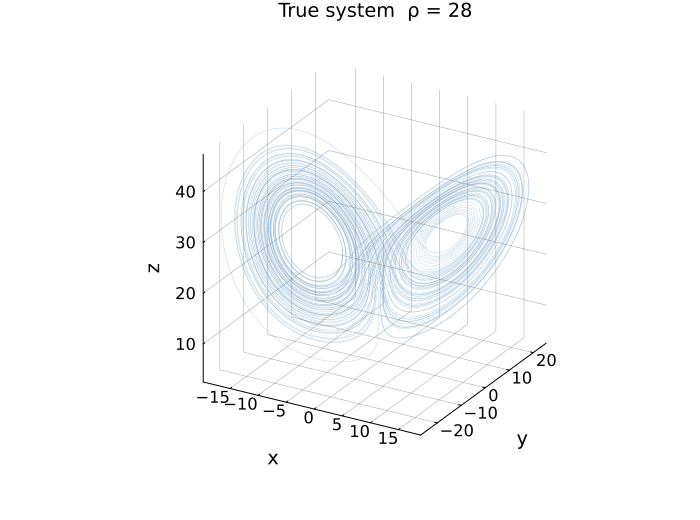

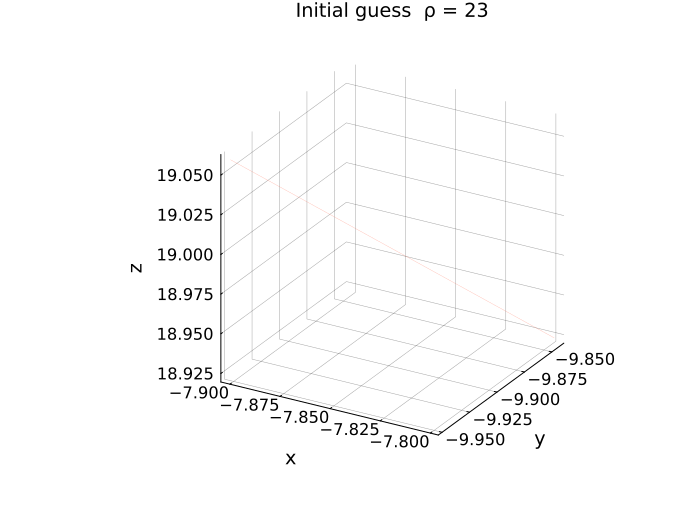

In [5]:

true_params  = classic_params()
init_params  = L63Parameters(10.0, 23.0, 8.0/3.0)
u0           = [1.0, 1.0, 1.0]

println("True parameters : σ=", true_params.σ, "  ρ=", true_params.ρ, "  β=", round(true_params.β, digits=4))
println("Initial guess   : σ=", init_params.σ, "  ρ=", init_params.ρ,  "  β=", round(init_params.β, digits=4))
println("Δρ              : ", init_params.ρ - true_params.ρ, "  (", round(100*(init_params.ρ - true_params.ρ)/true_params.ρ, digits=1), "%)")

sol_true  = integrate(true_params, u0, (0.0, T_TOTAL), DT)
sol_guess = integrate(init_params, u0, (0.0, 10.0), DT)
println("Trajectory: $(size(sol_true.u, 1)) timesteps × $(size(sol_true.u, 2)) dimensions")

nburn = 2000
p_true = plot(sol_true.u[nburn:end, 1], sol_true.u[nburn:end, 2], sol_true.u[nburn:end, 3];
              seriestype=:path3d, linewidth=0.3, linecolor=:steelblue, alpha=0.55,
              label=false, xlabel="x", ylabel="y", zlabel="z",
              title="True system  ρ = 28", camera=(30, 25), size=(700, 520))
display(p_true)

p_guess = plot(sol_guess.u[nburn:min(end,size(sol_guess.u,1)), 1],
               sol_guess.u[nburn:min(end,size(sol_guess.u,1)), 2],
               sol_guess.u[nburn:min(end,size(sol_guess.u,1)), 3];
               seriestype=:path3d, linewidth=0.3, linecolor=:tomato, alpha=0.55,
               label=false, xlabel="x", ylabel="y", zlabel="z",
               title="Initial guess  ρ = 23", camera=(30, 25), size=(700, 520))
display(p_guess)


In [13]:
const N_SEEDS = 10   # independent trajectories for statistical robustness

# ─── Single-run experiment ────────────────────────────────────────────────────
function run_rho_window_experiment(
        window_sizes, sol_true, true_params, init_params;
        epochs    = 200,
        batch_sz  = 8,
        verbose   = false,
    )

    true_ρ  = true_params.ρ
    results = []

    for (i, ws) in enumerate(window_sizes)
        stride = max(1, ws ÷ 2)
        lt     = ws / LYAP_STEPS

        println(@sprintf("[%d/%d]  window = %4d steps  (%.2f τ_L)  …",
                         i, length(window_sizes), ws, lt))

        m = TrainingMetrics{Float64}()

        res = modular_train!(
            deepcopy(init_params),
            sol_true;
            optimizer_config         = adamw_config(learning_rate = 5e-3,
                                                     weight_decay  = 1e-4),
            loss_function            = window_rmse,
            epochs                   = epochs,
            window_size              = ws,
            stride                   = stride,
            batch_size               = batch_sz,
            train_fraction           = 1.0,
            update_σ                 = false,
            update_ρ                 = true,
            update_β                 = false,
            update_x_s               = false,
            update_y_s               = false,
            update_z_s               = false,
            verbose                  = verbose,
            eval_every               = 10,
            early_stopping_patience  = epochs,
            early_stopping_min_delta = 1e-12,
            track_gradients          = true,
            metrics                  = m,
        )

        grads_ind = collect(m.individual_gradients_ρ)
        grads_ep  = collect(m.epoch_gradients_ρ)
        rho_trace = [p.ρ for p in res.param_history]

        push!(results, (
            name          = SCENARIO_NAMES[i],
            window_size   = ws,
            lyap_times    = lt,
            regime        = lt < 2.0 ? "Weather" : "Climate",
            final_rho     = res.best_params.ρ,
            param_error   = abs(res.best_params.ρ - true_ρ),
            final_loss    = isempty(res.train_loss) ? NaN : res.train_loss[end],
            loss_curve    = collect(res.train_loss),
            rho_trace     = rho_trace,
            grads_ep      = grads_ep,
            grad_abs_mean = isempty(grads_ind) ? NaN : mean(abs.(grads_ind)),
            grad_std      = isempty(grads_ind) ? NaN : std(grads_ind),
            grad_cov      = isempty(grads_ind) ? NaN :
                                std(grads_ind) / (abs(mean(grads_ind)) + 1e-12),
        ))

        println(@sprintf("         ρ_final = %.4f   |Δρ| = %.4f   loss = %.6f",
                         results[end].final_rho,
                         results[end].param_error,
                         results[end].final_loss))
    end

    return results
end

# ─── Multi-seed wrapper ────────────────────────────────────────────────────────
# Each seed uses a different segment of the true attractor as observation data.
function run_multi_seed_experiment(window_sizes, true_params, init_params;
                                    n_seeds=N_SEEDS, epochs=200, batch_sz=8)
    all_results = []
    for s in 1:n_seeds
        Random.seed!(s * 17)
        println("\n══ Seed $s / $n_seeds ═══════════════════════════════════════════")
        # Warm up from a distinct IC onto the attractor, then run observation trajectory
        u0_s = let u_rand = Float64[s * 3.1 - 4.0, s * (-2.3) + 6.0, s * 1.7 + 15.0]
            sol_w = integrate(true_params, u_rand, (0.0, 50.0), DT)   # spin-up
            sol_w.u[end, :]
        end
        sol_s = integrate(true_params, u0_s, (0.0, T_TOTAL), DT)
        push!(all_results,
              run_rho_window_experiment(window_sizes, sol_s, true_params, init_params;
                                        epochs=epochs, batch_sz=batch_sz))
    end
    return all_results
end

# ─── Aggregate across seeds ────────────────────────────────────────────────────
function mean_curve(curves)
    T   = minimum(length, curves)
    mat = reduce(hcat, [c[1:T] for c in curves])   # T × n_seeds
    return vec(mean(mat, dims=2))
end

function aggregate_seeds(all_results)
    n_s = length(all_results)
    return [(
        name        = all_results[1][i].name,
        window_size = all_results[1][i].window_size,
        lyap_times  = all_results[1][i].lyap_times,
        regime      = all_results[1][i].regime,
        mean_error  = mean(all_results[s][i].param_error   for s in 1:n_s),
        std_error   = std( all_results[s][i].param_error   for s in 1:n_s),
        mean_grad   = mean(all_results[s][i].grad_abs_mean for s in 1:n_s),
        std_grad    = std( all_results[s][i].grad_abs_mean for s in 1:n_s),
        mean_gcov   = mean(all_results[s][i].grad_cov      for s in 1:n_s),
        std_gcov    = std( all_results[s][i].grad_cov      for s in 1:n_s),
        all_losses  = [all_results[s][i].loss_curve for s in 1:n_s],
        all_rhos    = [all_results[s][i].rho_trace  for s in 1:n_s],
    ) for i in eachindex(all_results[1])]
end

println("Running ρ-recovery: $(N_SEEDS) seeds × $(length(WINDOW_SIZES)) window lengths …\n")
all_seeds   = run_multi_seed_experiment(WINDOW_SIZES, true_params, init_params;
                                         epochs=200, batch_sz=8)
results_agg = aggregate_seeds(all_seeds)
results     = all_seeds[1]   # seed-1 reference for summary table
println("\n✓ Experiment complete  ($N_SEEDS seeds)")

Running ρ-recovery: 10 seeds × 8 window lengths …


══ Seed 1 / 10 ═══════════════════════════════════════════
[1/8]  window =   18 steps  (0.10 τ_L)  …
         ρ_final = 28.0031   |Δρ| = 0.0031   loss = 0.075886
[2/8]  window =   36 steps  (0.20 τ_L)  …
         ρ_final = 28.0009   |Δρ| = 0.0009   loss = 0.071678
[3/8]  window =   90 steps  (0.50 τ_L)  …
         ρ_final = 28.0066   |Δρ| = 0.0066   loss = 0.069650
[4/8]  window =  180 steps  (1.00 τ_L)  …
         ρ_final = 28.0045   |Δρ| = 0.0045   loss = 0.093236
[5/8]  window =  360 steps  (2.00 τ_L)  …
         ρ_final = 24.5521   |Δρ| = 3.4479   loss = 8.156601
[6/8]  window =  900 steps  (5.00 τ_L)  …
         ρ_final = 23.0052   |Δρ| = 4.9948   loss = 10.311879
[7/8]  window = 1800 steps  (10.00 τ_L)  …
         ρ_final = 22.9904   |Δρ| = 5.0096   loss = 11.176374
[8/8]  window = 3600 steps  (20.00 τ_L)  …
         ρ_final = 23.0943   |Δρ| = 4.9057   loss = 11.475961

══ Seed 2 / 10 ═══════════════════════════════════════════



## Gradient Regime Analysis: Window Length vs. Gradient Quality

### Scientific question

**Does the length of the trajectory window used for gradient computation
determine whether gradient-based parameter estimation succeeds or fails?**

We test this by recovering the Lorenz-63 parameter **ρ** (true value 28, initial
guess 23) over 8 window lengths that span from 0.1 to 20 Lyapunov times
(τ_L ≈ 0.9 time units = 180 timesteps).

---

### Theoretical background

For a trajectory of length W integrated with Runge-Kutta, the gradient
∂L/∂ρ is computed by reverse-mode AD (Enzyme) through the entire RK4 chain.
In a chaotic system, the **tangent propagator** grows as

$$\|\mathbf{J}^T\| \sim e^{\lambda_1 W}$$

where λ₁ ≈ 0.906 is the largest Lyapunov exponent.

| Window regime | Length relative to τ_L | Expected gradient behaviour |
|---|---|---|
| **Ultra-short** (< 0.5 τ_L) | < 90 steps | Weak signal — trajectory too short to distinguish ρ values |
| **Weather** (0.5–2 τ_L) | 90–360 steps | Clean, computable gradient; parameter estimation works |
| **Transition** (2–5 τ_L) | 360–900 steps | Gradient begins to amplify; variance increases |
| **Climate** (> 5 τ_L) | > 900 steps | Exponential amplification → gradient explosion; optimiser diverges |

### Key metrics

- **|∂L/∂ρ|** — individual window gradient magnitude (per window, before batching)
- **Gradient CoV** = std/|mean| — measures signal-to-noise ratio; high CoV → chaotic, unreliable
- **|ρ_final − 28|** — downstream estimation accuracy
- **Training loss curve** — convergence vs. divergence


In [14]:

# ─── Results summary table ────────────────────────────────────────────────────
summary_df = DataFrame(
    scenario       = [r.name          for r in results],
    window_steps   = [r.window_size   for r in results],
    lyap_times     = round.([r.lyap_times    for r in results], digits=2),
    regime         = [r.regime        for r in results],
    ρ_estimated    = round.([r.final_rho     for r in results], digits=4),
    Δρ             = round.([r.param_error   for r in results], digits=4),
    final_loss     = round.([r.final_loss    for r in results], sigdigits=4),
    grad_abs_mean  = round.([r.grad_abs_mean for r in results], sigdigits=3),
    grad_std       = round.([r.grad_std      for r in results], sigdigits=3),
    grad_cov       = round.([r.grad_cov      for r in results], sigdigits=3),
)

println("ρ-recovery experiment results  (true ρ = 28, initial ρ = 23)")
println("="^90)
display(summary_df)
println()

# Quick sanity: best and worst scenario
best_i  = argmin([r.param_error for r in results])
worst_i = argmax([r.param_error for r in results])
println("Best  recovery : $(results[best_i].name)  →  ρ̂ = $(round(results[best_i].final_rho, digits=4))  (|Δρ|=$(round(results[best_i].param_error, digits=4)))")
println("Worst recovery : $(results[worst_i].name)  →  ρ̂ = $(round(results[worst_i].final_rho, digits=4))  (|Δρ|=$(round(results[worst_i].param_error, digits=4)))")


ρ-recovery experiment results  (true ρ = 28, initial ρ = 23)


Row,scenario,window_steps,lyap_times,regime,ρ_estimated,Δρ,final_loss,grad_abs_mean,grad_std,grad_cov
,String,Int64,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64
1,ultra_short,18,0.1,Weather,28.0031,0.0031,0.07589,0.13,0.172,47.3
2,very_short,36,0.2,Weather,28.0009,0.0009,0.07168,0.265,0.327,25.5
3,short,90,0.5,Weather,28.0066,0.0066,0.06965,0.552,0.621,9.78
4,medium,180,1.0,Weather,28.0045,0.0045,0.09324,1.66,3.62,20.2
5,transition,360,2.0,Climate,24.5521,3.4479,8.157,1.8,50.3,604.0
6,long,900,5.0,Climate,23.0052,4.9948,10.31,2.89,43.2,139.0
7,very_long,1800,10.0,Climate,22.9904,5.0096,11.18,63.6,454.0,81.4
8,climate,3600,20.0,Climate,23.0943,4.9057,11.48,74900.0,404000.0,24.7



Best  recovery : very_short  →  ρ̂ = 28.0009  (|Δρ|=0.0009)
Worst recovery : very_long  →  ρ̂ = 22.9904  (|Δρ|=5.0096)


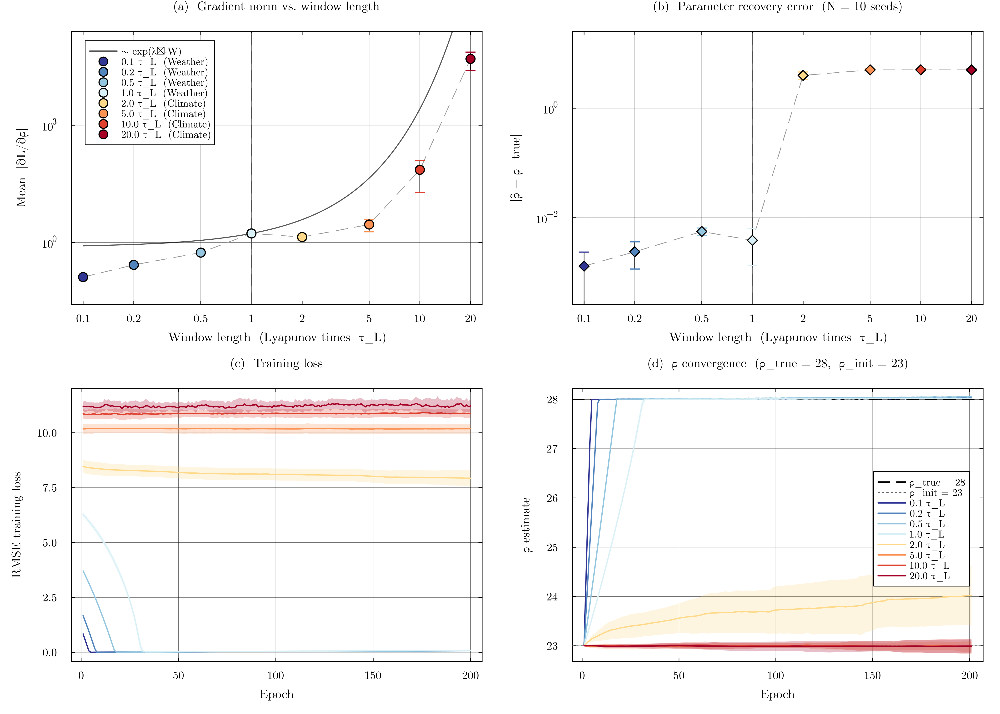

GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321


In [15]:
# ─── Journal-quality 4-panel figure ──────────────────────────────────────────
Plots.default(fontfamily = "Computer Modern")

n   = length(results_agg)
lts = [r.lyap_times for r in results_agg]
pal = get(ColorSchemes.RdYlBu_10, range(1.0, 0.0, length=n))

fs = 11
kw = (;
    titlefontsize  = fs,
    guidefontsize  = fs,
    tickfontsize   = fs - 1,
    legendfontsize = fs - 2,
    framestyle     = :box,
    left_margin    = 8Plots.mm,
    bottom_margin  = 6Plots.mm,
    top_margin     = 5Plots.mm,
    right_margin   = 4Plots.mm,
)

valid_grads = filter(isfinite, [r.mean_grad  for r in results_agg])
valid_errs  = filter(isfinite, [r.mean_error for r in results_agg])

# minimum bar half-height on log scale so every point shows a tick
MIN_REL = 0.04   # 4 % of mean value

# ── (a) Gradient norm ─────────────────────────────────────────────────────────
pA = plot(;
    xscale = :log10, yscale = :log10,
    xlabel = "Window length  (Lyapunov times  τ_L)",
    ylabel = "Mean  |∂L/∂ρ|",
    title  = "(a)  Gradient norm vs. window length",
    xticks = ([0.1,0.2,0.5,1,2,5,10,20], ["0.1","0.2","0.5","1","2","5","10","20"]),
    ylims  = (minimum(valid_grads)/5, maximum(valid_grads)*5),
    legend = :topleft,
    kw...
)
plot!(pA, lts, [r.mean_grad for r in results_agg];
      linecolor=:gray60, linewidth=1.0, linestyle=:dash, label=false)

λ₁  = 0.906
mid = findfirst(r -> r.lyap_times >= 1.0, results_agg)
if !isnothing(mid)
    C   = results_agg[mid].mean_grad / exp(λ₁ * results_agg[mid].window_size * DT)
    ltr = range(minimum(lts), maximum(lts), length=200)
    plot!(pA, ltr, C .* exp.(λ₁ .* ltr .* LYAP_STEPS .* DT);
          linecolor=:black, linewidth=1.5, alpha=0.65, linestyle=:solid,
          label="∼ exp(λ₁·W)")
end
vline!(pA, [1.0]; linestyle=:dash, linewidth=1.2, linecolor=:gray30, label=false)

for (i, r) in enumerate(results_agg)
    isfinite(r.mean_grad) || continue
    sv  = filter(isfinite, [all_seeds[s][i].grad_abs_mean for s in eachindex(all_seeds)])
    σ_g = length(sv) > 1 ? std(sv) : 0.0
    bar = max(σ_g, r.mean_grad * MIN_REL)   # always visible
    scatter!(pA, [lts[i]], [r.mean_grad];
             yerror            = bar,
             linecolor         = :black, linewidth = 1.0,
             markercolor       = pal[i], markersize = 7,
             markerstrokewidth = 0.8, markerstrokecolor = :black,
             markershape       = :circle,
             label = @sprintf("%.1f τ_L  (%s)", r.lyap_times, r.regime))
end

# ── (b) Parameter recovery error ─────────────────────────────────────────────
pB = plot(;
    xscale = :log10, yscale = :log10,
    xlabel = "Window length  (Lyapunov times  τ_L)",
    ylabel = "|ρ̂ − ρ_true|",
    title  = "(b)  Parameter recovery error  (N = $(N_SEEDS) seeds)",
    xticks = ([0.1,0.2,0.5,1,2,5,10,20], ["0.1","0.2","0.5","1","2","5","10","20"]),
    ylims  = (minimum(valid_errs)/5, maximum(valid_errs)*5),
    legend = false,
    kw...
)
plot!(pB, lts, [r.mean_error for r in results_agg];
      linecolor=:gray60, linewidth=1.0, linestyle=:dash, label=false)
vline!(pB, [1.0]; linestyle=:dash, linewidth=1.2, linecolor=:gray30, label=false)

for (i, r) in enumerate(results_agg)
    isfinite(r.mean_error) || continue
    sv  = filter(isfinite, [all_seeds[s][i].param_error for s in eachindex(all_seeds)])
    σ_e = length(sv) > 1 ? std(sv) : 0.0
    bar = max(σ_e, r.mean_error * MIN_REL)
    scatter!(pB, [lts[i]], [r.mean_error];
             yerror            = bar,
             linecolor         = :black, linewidth = 1.0,
             markercolor       = pal[i], markersize = 7,
             markerstrokewidth = 0.8, markerstrokecolor = :black,
             markershape       = :diamond, label = false)
end

# ── (c) Training loss — shaded uncertainty band ───────────────────────────────
pC = plot(;
    xlabel = "Epoch",
    ylabel = "RMSE training loss",
    title  = "(c)  Training loss",
    legend = false,
    kw...
)
hline!(pC, [1e-2]; linestyle=:dot, linecolor=:gray60, linewidth=0.8)

for (i, r) in enumerate(results_agg)
    T   = minimum(length, r.all_losses)
    mat = reduce(hcat, [lc[1:T] for lc in r.all_losses])
    mu  = vec(mean(mat, dims=2))
    sd  = vec(std(mat,  dims=2))
    plot!(pC, mu; ribbon=sd, fillalpha=0.25,
          color=pal[i], linewidth=1.8, label=false)
end

# ── (d) ρ convergence — shaded uncertainty band ───────────────────────────────
pD = plot(;
    xlabel = "Epoch",
    ylabel = "ρ estimate",
    title  = "(d)  ρ convergence  (ρ_true = 28,  ρ_init = 23)",
    legend = :right,
    kw...
)
hline!(pD, [28.0]; linestyle=:dash, linecolor=:black,  linewidth=1.8, label="ρ_true = 28")
hline!(pD, [23.0]; linestyle=:dot,  linecolor=:gray40, linewidth=1.0, label="ρ_init = 23")

for (i, r) in enumerate(results_agg)
    T   = minimum(length, r.all_rhos)
    mat = reduce(hcat, [rt[1:T] for rt in r.all_rhos])
    mu  = vec(mean(mat, dims=2))
    sd  = vec(std(mat,  dims=2))
    plot!(pD, mu; ribbon=sd, fillalpha=0.25,
          color=pal[i], linewidth=1.8,
          label=@sprintf("%.1f τ_L", r.lyap_times))
end

# ── Assemble ──────────────────────────────────────────────────────────────────
fig_main = plot(pA, pB, pC, pD; layout=(2,2), size=(1400, 1000), dpi=300)
display(fig_main)

In [16]:
img_dir = "img"
mkpath(img_dir)
savefig(fig_main, joinpath(img_dir, "window_length_experiment.pdf"))
savefig(fig_main, joinpath(img_dir, "window_length_experiment.png"))
println("Saved → ", abspath(img_dir))

Saved → /Users/niklasviebig/master_thesis/LorenzParameterEstimation/examples_weather/test_cases_milan/img


GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8321


---
## All-Parameter Recovery: σ, ρ, β Simultaneously

We now repeat the window-length experiment but **estimate all three Lorenz parameters at once**:

| Parameter | True value | Initial guess | Initial error |
|-----------|-----------|--------------|--------------|
| σ | 10.0 | 7.0 | 30 % |
| ρ | 28.0 | 23.0 | 18 % |
| β | 8/3 ≈ 2.667 | 2.0 | 25 % |

The same 8 window lengths (0.1 → 20 Lyapunov times) and 100-seed design are used.
Each panel in the 3 × 3 figure below corresponds to one parameter (rows) and one
diagnostic (columns: gradient norm · parameter error · convergence trace).

In [17]:

# ─── All-param initial conditions ────────────────────────────────────────────
init_params_all = L63Parameters(7.0, 23.0, 2.0)   # σ,ρ,β all wrong

println("True params   : σ=", true_params.σ,  "  ρ=", true_params.ρ,
        "  β=", round(true_params.β, digits=4))
println("Initial guess : σ=", init_params_all.σ, "  ρ=", init_params_all.ρ,
        "  β=", round(init_params_all.β, digits=4))

# ─── Single-run experiment (all three params) ─────────────────────────────────
function run_all_params_window_experiment(
        window_sizes, sol_true, true_params, init_params;
        epochs   = 200,
        batch_sz = 8,
        verbose  = false,
    )
    true_σ, true_ρ, true_β = true_params.σ, true_params.ρ, true_params.β
    results = []

    for (i, ws) in enumerate(window_sizes)
        stride = max(1, ws ÷ 2)
        lt     = ws / LYAP_STEPS

        println(@sprintf("[%d/%d]  window = %4d steps  (%.2f τ_L) …",
                         i, length(window_sizes), ws, lt))

        m   = TrainingMetrics{Float64}()
        res = modular_train!(
            deepcopy(init_params),
            sol_true;
            optimizer_config         = adamw_config(learning_rate = 5e-3,
                                                     weight_decay  = 1e-4),
            loss_function            = window_rmse,
            epochs                   = epochs,
            window_size              = ws,
            stride                   = stride,
            batch_size               = batch_sz,
            train_fraction           = 1.0,
            update_σ                 = true,
            update_ρ                 = true,
            update_β                 = true,
            update_x_s               = false,
            update_y_s               = false,
            update_z_s               = false,
            verbose                  = verbose,
            eval_every               = 10,
            early_stopping_patience  = epochs,
            early_stopping_min_delta = 1e-12,
            track_gradients          = true,
            metrics                  = m,
        )

        gi_σ = collect(m.individual_gradients_σ)
        gi_ρ = collect(m.individual_gradients_ρ)
        gi_β = collect(m.individual_gradients_β)

        σ_tr = [p.σ for p in res.param_history]
        ρ_tr = [p.ρ for p in res.param_history]
        β_tr = [p.β for p in res.param_history]

        push!(results, (
            name           = SCENARIO_NAMES[i],
            window_size    = ws,
            lyap_times     = lt,
            regime         = lt < 2.0 ? "Weather" : "Climate",
            # final values
            final_σ        = res.best_params.σ,
            final_ρ        = res.best_params.ρ,
            final_β        = res.best_params.β,
            # parameter errors (absolute)
            err_σ          = abs(res.best_params.σ - true_σ),
            err_ρ          = abs(res.best_params.ρ - true_ρ),
            err_β          = abs(res.best_params.β - true_β),
            # gradient stats
            grad_mean_σ    = isempty(gi_σ) ? NaN : mean(abs.(gi_σ)),
            grad_mean_ρ    = isempty(gi_ρ) ? NaN : mean(abs.(gi_ρ)),
            grad_mean_β    = isempty(gi_β) ? NaN : mean(abs.(gi_β)),
            # convergence traces
            sigma_trace    = σ_tr,
            rho_trace      = ρ_tr,
            beta_trace     = β_tr,
            loss_curve     = collect(res.train_loss),
            final_loss     = isempty(res.train_loss) ? NaN : res.train_loss[end],
        ))

        println(@sprintf("         σ=%6.4f  ρ=%6.4f  β=%6.4f   loss=%.6f",
                         results[end].final_σ, results[end].final_ρ,
                         results[end].final_β, results[end].final_loss))
    end
    return results
end

# ─── Multi-seed wrapper ────────────────────────────────────────────────────────
function run_multi_seed_all_params(window_sizes, true_params, init_params;
                                    n_seeds=N_SEEDS, epochs=200, batch_sz=8)
    all_results = []
    for s in 1:n_seeds
        Random.seed!(s * 17)
        println("\n══ Seed $s / $n_seeds ═══════════════════════════════════════════")
        u0_s = let u_rand = Float64[s * 3.1 - 4.0, s * (-2.3) + 6.0, s * 1.7 + 15.0]
            sol_w = integrate(true_params, u_rand, (0.0, 50.0), DT)
            sol_w.u[end, :]
        end
        sol_s = integrate(true_params, u0_s, (0.0, T_TOTAL), DT)
        push!(all_results,
              run_all_params_window_experiment(window_sizes, sol_s,
                                               true_params, init_params;
                                               epochs=epochs, batch_sz=batch_sz))
    end
    return all_results
end

# ─── Aggregate ────────────────────────────────────────────────────────────────
function aggregate_all_params(all_results)
    n_s = length(all_results)
    return [(
        name        = all_results[1][i].name,
        window_size = all_results[1][i].window_size,
        lyap_times  = all_results[1][i].lyap_times,
        regime      = all_results[1][i].regime,
        # means + stds of errors
        mean_err_σ  = mean(all_results[s][i].err_σ       for s in 1:n_s),
        std_err_σ   = std( all_results[s][i].err_σ       for s in 1:n_s),
        mean_err_ρ  = mean(all_results[s][i].err_ρ       for s in 1:n_s),
        std_err_ρ   = std( all_results[s][i].err_ρ       for s in 1:n_s),
        mean_err_β  = mean(all_results[s][i].err_β       for s in 1:n_s),
        std_err_β   = std( all_results[s][i].err_β       for s in 1:n_s),
        # means + stds of gradient norms
        mean_grad_σ = mean(all_results[s][i].grad_mean_σ for s in 1:n_s),
        std_grad_σ  = std( all_results[s][i].grad_mean_σ for s in 1:n_s),
        mean_grad_ρ = mean(all_results[s][i].grad_mean_ρ for s in 1:n_s),
        std_grad_ρ  = std( all_results[s][i].grad_mean_ρ for s in 1:n_s),
        mean_grad_β = mean(all_results[s][i].grad_mean_β for s in 1:n_s),
        std_grad_β  = std( all_results[s][i].grad_mean_β for s in 1:n_s),
        # convergence traces
        all_sigmas  = [all_results[s][i].sigma_trace for s in 1:n_s],
        all_rhos    = [all_results[s][i].rho_trace   for s in 1:n_s],
        all_betas   = [all_results[s][i].beta_trace  for s in 1:n_s],
        all_losses  = [all_results[s][i].loss_curve  for s in 1:n_s],
    ) for i in eachindex(all_results[1])]
end

println("Running all-param recovery: $(N_SEEDS) seeds × $(length(WINDOW_SIZES)) window lengths …\n")
all_seeds_3p   = run_multi_seed_all_params(WINDOW_SIZES, true_params, init_params_all;
                                            epochs=200, batch_sz=8)
results_agg_3p = aggregate_all_params(all_seeds_3p)
println("\n✓ All-parameter experiment complete  ($N_SEEDS seeds)")


True params   : σ=10.0  ρ=28.0  β=2.6667
Initial guess : σ=7.0  ρ=23.0  β=2.0
Running all-param recovery: 10 seeds × 8 window lengths …


══ Seed 1 / 10 ═══════════════════════════════════════════
[1/8]  window =   18 steps  (0.10 τ_L) …
         σ=10.0018  ρ=28.0030  β=2.6667   loss=0.041295
[2/8]  window =   36 steps  (0.20 τ_L) …
         σ=10.0091  ρ=28.0007  β=2.6666   loss=0.036099
[3/8]  window =   90 steps  (0.50 τ_L) …
         σ=10.0100  ρ=28.0020  β=2.6664   loss=0.027495
[4/8]  window =  180 steps  (1.00 τ_L) …
         σ=10.0089  ρ=28.0035  β=2.6673   loss=0.050379
[5/8]  window =  360 steps  (2.00 τ_L) …
         σ=11.1891  ρ=25.3589  β=2.3688   loss=7.080400
[6/8]  window =  900 steps  (5.00 τ_L) …
         σ=7.3738  ρ=22.9397  β=1.8022   loss=9.812585
[7/8]  window = 1800 steps  (10.00 τ_L) …
         σ=7.0211  ρ=23.0561  β=2.0019   loss=10.678692
[8/8]  window = 3600 steps  (20.00 τ_L) …
         σ=6.8287  ρ=22.8772  β=2.1264   loss=11.055861

══ Seed 2 / 10 ══════════

In [18]:

# ─── Summary table: all-three-parameter recovery ─────────────────────────────
ref3   = all_seeds_3p[1]   # seed-1 reference
true_σ = true_params.σ; true_ρ = true_params.ρ; true_β = true_params.β

summary_3p = DataFrame(
    scenario  = [r.name       for r in ref3],
    lyap_τ    = round.([r.lyap_times for r in ref3], digits=2),
    regime    = [r.regime      for r in ref3],
    σ_hat     = round.([r.final_σ    for r in ref3], digits=4),
    Δσ        = round.([r.err_σ      for r in ref3], digits=4),
    ρ_hat     = round.([r.final_ρ    for r in ref3], digits=4),
    Δρ        = round.([r.err_ρ      for r in ref3], digits=4),
    β_hat     = round.([r.final_β    for r in ref3], digits=4),
    Δβ        = round.([r.err_β      for r in ref3], digits=4),
    loss      = round.([r.final_loss for r in ref3], sigdigits=4),
)
println("All-parameter recovery  (σ_true=10, ρ_true=28, β_true=2.667 | seed 1)")
println("="^95)
display(summary_3p)


All-parameter recovery  (σ_true=10, ρ_true=28, β_true=2.667 | seed 1)


Row,scenario,lyap_τ,regime,σ_hat,Δσ,ρ_hat,Δρ,β_hat,Δβ,loss
,String,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,ultra_short,0.1,Weather,10.0018,0.0018,28.003,0.003,2.6667,0.0,0.04129
2,very_short,0.2,Weather,10.0091,0.0091,28.0007,0.0007,2.6666,0.0001,0.0361
3,short,0.5,Weather,10.01,0.01,28.002,0.002,2.6664,0.0003,0.0275
4,medium,1.0,Weather,10.0089,0.0089,28.0035,0.0035,2.6673,0.0006,0.05038
5,transition,2.0,Climate,11.1891,1.1891,25.3589,2.6411,2.3688,0.2978,7.08
6,long,5.0,Climate,7.3738,2.6262,22.9397,5.0603,1.8022,0.8645,9.813
7,very_long,10.0,Climate,7.0211,2.9789,23.0561,4.9439,2.0019,0.6647,10.68
8,climate,20.0,Climate,6.8287,3.1713,22.8772,5.1228,2.1264,0.5403,11.06


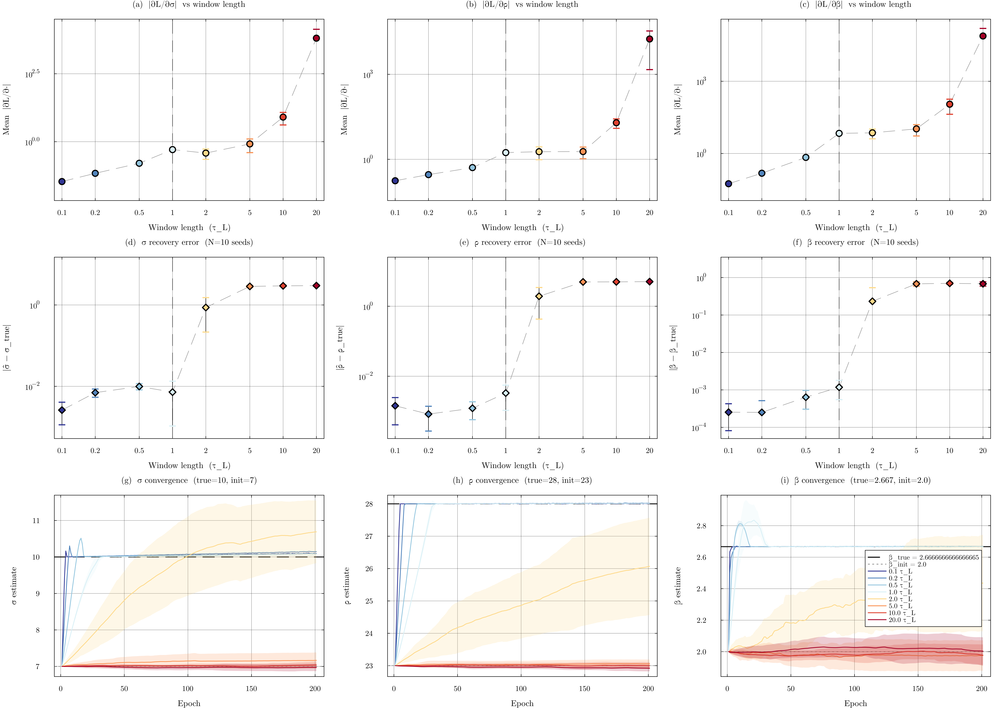

In [19]:

# ─── 3 × 3 publication figure: σ / ρ / β  ×  gradient | error | convergence ─
Plots.default(fontfamily = "Computer Modern")

n3   = length(results_agg_3p)
lts3 = [r.lyap_times for r in results_agg_3p]
pal3 = get(ColorSchemes.RdYlBu_10, range(1.0, 0.0, length=n3))

fs3 = 11
kw3 = (;
    titlefontsize  = fs3,
    guidefontsize  = fs3,
    tickfontsize   = fs3 - 1,
    legendfontsize = fs3 - 2,
    framestyle     = :box,
    left_margin    = 9Plots.mm,
    bottom_margin  = 6Plots.mm,
    top_margin     = 4Plots.mm,
    right_margin   = 3Plots.mm,
)

MIN_REL3 = 0.04
xtick_vals  = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20]
xtick_strs  = ["0.1","0.2","0.5","1","2","5","10","20"]

# Helper: scatter with error bars on log-log axes
function scatter_log!(p, lts, means, stds; kws...)
    for (i, (lt, mu, sd)) in enumerate(zip(lts, means, stds))
        isfinite(mu) || continue
        bar = max(sd, mu * MIN_REL3)
        scatter!(p, [lt], [mu]; yerror=bar,
                 linecolor=:black, linewidth=1.0,
                 markercolor=pal3[i], markersize=7,
                 markerstrokewidth=0.8, markerstrokecolor=:black,
                 kws...)
    end
end

# ── Column 1: Gradient norms ──────────────────────────────────────────────────
function grad_panel(means, stds, title_str)
    valid = filter(isfinite, means)
    p = plot(; xscale=:log10, yscale=:log10,
               xlabel = "Window length  (τ_L)",
               ylabel = "Mean  |∂L/∂·|",
               title  = title_str,
               xticks = (xtick_vals, xtick_strs),
               ylims  = (minimum(valid)/5, maximum(valid)*5),
               legend = false,
               kw3...)
    plot!(p, lts3, means; linecolor=:gray60, linewidth=1.0, linestyle=:dash)
    vline!(p, [1.0]; linestyle=:dash, linewidth=1.2, linecolor=:gray30)
    scatter_log!(p, lts3, means, stds; markershape=:circle, label=false)
    return p
end

# ── Column 2: Parameter errors ────────────────────────────────────────────────
function err_panel(means, stds, param_name, unit_str, title_str)
    valid = filter(isfinite, means)
    p = plot(; xscale=:log10, yscale=:log10,
               xlabel = "Window length  (τ_L)",
               ylabel = "|$(param_name)̂ − $(param_name)_true|",
               title  = title_str,
               xticks = (xtick_vals, xtick_strs),
               ylims  = (minimum(valid)/5, maximum(valid)*5),
               legend = false,
               kw3...)
    plot!(p, lts3, means; linecolor=:gray60, linewidth=1.0, linestyle=:dash)
    vline!(p, [1.0]; linestyle=:dash, linewidth=1.2, linecolor=:gray30)
    scatter_log!(p, lts3, means, stds; markershape=:diamond, label=false)
    return p
end

# ── Column 3: Convergence (shaded ribbon) ────────────────────────────────────
function conv_panel(traces_per_seed, true_val, init_val, param_name, title_str; show_legend=false)
    p = plot(; xlabel="Epoch", ylabel="$(param_name) estimate",
               title=title_str,
               legend = show_legend ? :right : false,
               kw3...)
    hline!(p, [true_val];  linestyle=:dash, linecolor=:black,  linewidth=1.8,
           label="$(param_name)_true = $(true_val)")
    hline!(p, [init_val];  linestyle=:dot,  linecolor=:gray40, linewidth=1.0,
           label="$(param_name)_init = $(init_val)")
    for (i, r) in enumerate(results_agg_3p)
        seqs = traces_per_seed(r)
        T    = minimum(length, seqs)
        mat  = reduce(hcat, [s[1:T] for s in seqs])
        mu   = vec(mean(mat, dims=2))
        sd   = vec(std(mat,  dims=2))
        plot!(p, mu; ribbon=sd, fillalpha=0.2, color=pal3[i], linewidth=1.6,
              label = show_legend ? @sprintf("%.1f τ_L", r.lyap_times) : false)
    end
    return p
end

# ── Build the 9 panels ────────────────────────────────────────────────────────
pG_σ = grad_panel([r.mean_grad_σ for r in results_agg_3p],
                   [r.std_grad_σ  for r in results_agg_3p],
                   "(a)  |∂L/∂σ|  vs window length")
pG_ρ = grad_panel([r.mean_grad_ρ for r in results_agg_3p],
                   [r.std_grad_ρ  for r in results_agg_3p],
                   "(b)  |∂L/∂ρ|  vs window length")
pG_β = grad_panel([r.mean_grad_β for r in results_agg_3p],
                   [r.std_grad_β  for r in results_agg_3p],
                   "(c)  |∂L/∂β|  vs window length")

pE_σ = err_panel([r.mean_err_σ for r in results_agg_3p],
                  [r.std_err_σ  for r in results_agg_3p],
                  "σ", "", "(d)  σ recovery error  (N=$(N_SEEDS) seeds)")
pE_ρ = err_panel([r.mean_err_ρ for r in results_agg_3p],
                  [r.std_err_ρ  for r in results_agg_3p],
                  "ρ", "", "(e)  ρ recovery error  (N=$(N_SEEDS) seeds)")
pE_β = err_panel([r.mean_err_β for r in results_agg_3p],
                  [r.std_err_β  for r in results_agg_3p],
                  "β", "", "(f)  β recovery error  (N=$(N_SEEDS) seeds)")

pC_σ = conv_panel(r -> r.all_sigmas, true_params.σ, init_params_all.σ, "σ",
                   "(g)  σ convergence  (true=10, init=7)")
pC_ρ = conv_panel(r -> r.all_rhos, true_params.ρ, init_params_all.ρ, "ρ",
                   "(h)  ρ convergence  (true=28, init=23)")
pC_β = conv_panel(r -> r.all_betas, true_params.β, init_params_all.β, "β",
                   "(i)  β convergence  (true=2.667, init=2.0)";
                   show_legend=true)

fig_3p = plot(pG_σ, pG_ρ, pG_β,
              pE_σ, pE_ρ, pE_β,
              pC_σ, pC_ρ, pC_β;
              layout=(3, 3), size=(2100, 1500), dpi=300)
display(fig_3p)


In [20]:

savefig(fig_3p, joinpath(img_dir, "all_params_window_experiment.pdf"))
savefig(fig_3p, joinpath(img_dir, "all_params_window_experiment.png"))
println("Saved → ", abspath(img_dir))


Saved → /Users/niklasviebig/master_thesis/LorenzParameterEstimation/examples_weather/test_cases_milan/img


In [21]:
# ============================================================
# Loss landscape: 1-D slices over σ, ρ, β for each window size
# ============================================================
# For each window: start from the true state, integrate with test params,
# compare to true trajectory via RMSE. Average over n_samples random windows.

function landscape_loss_avg(params, sol_true, window_size; n_samples=50, rng=MersenneTwister(0))
    N = size(sol_true.u, 1)
    max_start = N - window_size - 1
    n_use = min(n_samples, max_start)
    starts = randperm(rng, max_start)[1:n_use]
    losses = map(starts) do s
        u0_w   = collect(sol_true.u[s, :])
        pred   = integrate(params, u0_w, (0.0, window_size * DT), DT)
        # pred.u row 1 = u0_w (t=0), rows 2:end = predicted states after each step
        pred_mat = pred.u[2:end, :]
        true_mat = sol_true.u[s+1:s+window_size, :]
        sqrt(mean((pred_mat .- true_mat).^2))
    end
    return mean(losses)
end

# Parameter sweep ranges
ρ_range = range(15.0, 35.0, length=51)   # true=28, init=23
σ_range = range(4.0,  16.0, length=51)   # true=10, init=7
β_range = range(1.0,  4.0,  length=51)   # true=8/3≈2.667, init=2.0

landscape_ρ = zeros(length(ρ_range), length(WINDOW_SIZES))
landscape_σ = zeros(length(σ_range), length(WINDOW_SIZES))
landscape_β = zeros(length(β_range), length(WINDOW_SIZES))

for (j, ws) in enumerate(WINDOW_SIZES)
    println("Computing landscape for window_size=$ws ($(round(ws/LYAP_STEPS, digits=1)) τ_L) …")
    for (i, v) in enumerate(ρ_range)
        landscape_ρ[i,j] = landscape_loss_avg(
            L63Parameters(true_params.σ, v, true_params.β), sol_true, ws)
    end
    for (i, v) in enumerate(σ_range)
        landscape_σ[i,j] = landscape_loss_avg(
            L63Parameters(v, true_params.ρ, true_params.β), sol_true, ws)
    end
    for (i, v) in enumerate(β_range)
        landscape_β[i,j] = landscape_loss_avg(
            L63Parameters(true_params.σ, true_params.ρ, v), sol_true, ws)
    end
end
println("Done.")

Computing landscape for window_size=18 (0.1 τ_L) …
Computing landscape for window_size=36 (0.2 τ_L) …
Computing landscape for window_size=90 (0.5 τ_L) …
Computing landscape for window_size=180 (1.0 τ_L) …
Computing landscape for window_size=360 (2.0 τ_L) …
Computing landscape for window_size=900 (5.0 τ_L) …
Computing landscape for window_size=1800 (10.0 τ_L) …
Computing landscape for window_size=3600 (20.0 τ_L) …
Done.


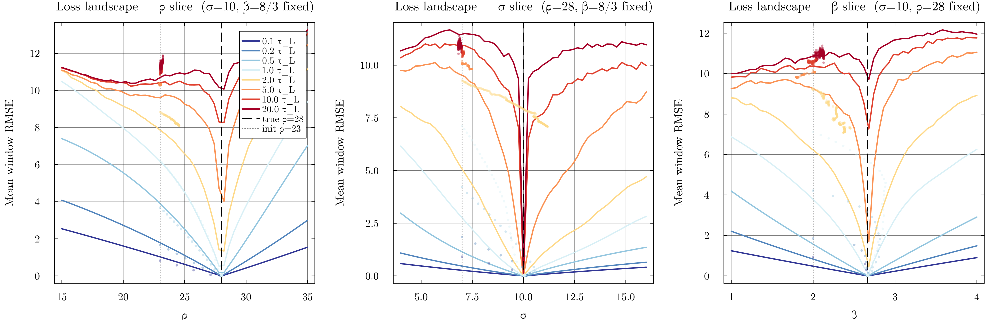

Saved → /Users/niklasviebig/master_thesis/LorenzParameterEstimation/examples_weather/test_cases_milan/img/loss_landscape.pdf


In [22]:
# ============================================================
# Plot: 1-D loss landscape slices with training paths overlaid
# ============================================================
pal_land = get(ColorSchemes.RdYlBu_10, range(1.0, 0.0, length=length(WINDOW_SIZES)))

kw_land = (;
    framestyle    = :box,
    left_margin   = 8Plots.mm,
    bottom_margin = 6Plots.mm,
    top_margin    = 4Plots.mm,
    right_margin  = 4Plots.mm,
    titlefontsize = 12,
    guidefontsize = 11,
    tickfontsize  = 10,
    legendfontsize= 9,
    linewidth     = 1.8,
)

# ── Panel 1: loss vs ρ  ───────────────────────────────────────────────────────
p_ρ = plot(; xlabel="ρ", ylabel="Mean window RMSE",
             title="Loss landscape — ρ slice  (σ=10, β=8/3 fixed)",
             legend=:topright, kw_land...)
for (j, ws) in enumerate(WINDOW_SIZES)
    lt = ws / LYAP_STEPS
    plot!(p_ρ, ρ_range, landscape_ρ[:, j];
          color=pal_land[j], label=@sprintf("%.1f τ_L", lt))
end
vline!(p_ρ, [true_params.ρ]; color=:black, linestyle=:dash, linewidth=1.5, label="true ρ=28")
vline!(p_ρ, [init_params.ρ]; color=:gray,  linestyle=:dot,  linewidth=1.2, label="init ρ=23")
# Overlay ρ-only training paths (seed 1, one path per window size)
for (j, ws) in enumerate(WINDOW_SIZES)
    r = all_seeds[1][j]
    n = min(length(r.rho_trace), length(r.loss_curve))
    scatter!(p_ρ, r.rho_trace[1:n], r.loss_curve[1:n];
             markersize=2, markeralpha=0.4, color=pal_land[j],
             markerstrokewidth=0, label=false)
end

# ── Panel 2: loss vs σ  ───────────────────────────────────────────────────────
p_σ = plot(; xlabel="σ", ylabel="Mean window RMSE",
             title="Loss landscape — σ slice  (ρ=28, β=8/3 fixed)",
             legend=false, kw_land...)
for (j, ws) in enumerate(WINDOW_SIZES)
    plot!(p_σ, σ_range, landscape_σ[:, j]; color=pal_land[j])
end
vline!(p_σ, [true_params.σ];     color=:black, linestyle=:dash, linewidth=1.5)
vline!(p_σ, [init_params_all.σ]; color=:gray,  linestyle=:dot,  linewidth=1.2)
# Overlay all-param training σ paths (seed 1)
for (j, ws) in enumerate(WINDOW_SIZES)
    r3 = all_seeds_3p[1][j]
    n  = min(length(r3.sigma_trace), length(r3.loss_curve))
    scatter!(p_σ, r3.sigma_trace[1:n], r3.loss_curve[1:n];
             markersize=2, markeralpha=0.4, color=pal_land[j],
             markerstrokewidth=0, label=false)
end

# ── Panel 3: loss vs β  ───────────────────────────────────────────────────────
p_β = plot(; xlabel="β", ylabel="Mean window RMSE",
             title="Loss landscape — β slice  (σ=10, ρ=28 fixed)",
             legend=false, kw_land...)
for (j, ws) in enumerate(WINDOW_SIZES)
    plot!(p_β, β_range, landscape_β[:, j]; color=pal_land[j])
end
vline!(p_β, [true_params.β];     color=:black, linestyle=:dash, linewidth=1.5)
vline!(p_β, [init_params_all.β]; color=:gray,  linestyle=:dot,  linewidth=1.2)
# Overlay all-param training β paths (seed 1)
for (j, ws) in enumerate(WINDOW_SIZES)
    r3 = all_seeds_3p[1][j]
    n  = min(length(r3.beta_trace), length(r3.loss_curve))
    scatter!(p_β, r3.beta_trace[1:n], r3.loss_curve[1:n];
             markersize=2, markeralpha=0.4, color=pal_land[j],
             markerstrokewidth=0, label=false)
end

# ── Assemble and save ─────────────────────────────────────────────────────────
fig_landscape = plot(p_ρ, p_σ, p_β; layout=(1, 3), size=(1500, 480), dpi=200)
display(fig_landscape)
savefig(fig_landscape, joinpath(img_dir, "loss_landscape.pdf"))
savefig(fig_landscape, joinpath(img_dir, "loss_landscape.png"))
println("Saved → ", abspath(joinpath(img_dir, "loss_landscape.pdf")))

In [23]:
# ============================================================
# 2D Loss landscape: all 3 parameter pairs × all 8 window sizes
# Grid: 21×21 points each; n_samples=3 random windows per point (fast)
# ============================================================

const N2D = 21          # grid resolution per axis
const N2D_SAMPLES = 3   # random windows to average per grid point

ρ2 = collect(range(15.0, 35.0, length=N2D))
σ2 = collect(range(4.0,  16.0, length=N2D))
β2 = collect(range(1.0,  4.0,  length=N2D))

# land2d_ρσ[i,j,k] = loss at ρ2[i], σ2[j], window WINDOW_SIZES[k] (β=true)
# land2d_ρβ[i,j,k] = loss at ρ2[i], β2[j], window WINDOW_SIZES[k] (σ=true)
# land2d_σβ[i,j,k] = loss at σ2[i], β2[j], window WINDOW_SIZES[k] (ρ=true)
land2d_ρσ = zeros(N2D, N2D, length(WINDOW_SIZES))
land2d_ρβ = zeros(N2D, N2D, length(WINDOW_SIZES))
land2d_σβ = zeros(N2D, N2D, length(WINDOW_SIZES))

for (k, ws) in enumerate(WINDOW_SIZES)
    lt = ws / LYAP_STEPS
    println("2D landscape  window=$ws ($(round(lt,digits=1)) τ_L) …")
    rng_k = MersenneTwister(k)
    for i in 1:N2D, j in 1:N2D
        land2d_ρσ[i,j,k] = landscape_loss_avg(
            L63Parameters(σ2[j], ρ2[i], true_params.β), sol_true, ws;
            n_samples=N2D_SAMPLES, rng=MersenneTwister(k))
        land2d_ρβ[i,j,k] = landscape_loss_avg(
            L63Parameters(true_params.σ, ρ2[i], β2[j]), sol_true, ws;
            n_samples=N2D_SAMPLES, rng=MersenneTwister(k))
        land2d_σβ[i,j,k] = landscape_loss_avg(
            L63Parameters(σ2[i], true_params.ρ, β2[j]), sol_true, ws;
            n_samples=N2D_SAMPLES, rng=MersenneTwister(k))
    end
end
println("2D landscapes done.")

2D landscape  window=18 (0.1 τ_L) …
2D landscape  window=36 (0.2 τ_L) …
2D landscape  window=90 (0.5 τ_L) …
2D landscape  window=180 (1.0 τ_L) …
2D landscape  window=360 (2.0 τ_L) …
2D landscape  window=900 (5.0 τ_L) …
2D landscape  window=1800 (10.0 τ_L) …
2D landscape  window=3600 (20.0 τ_L) …
2D landscapes done.


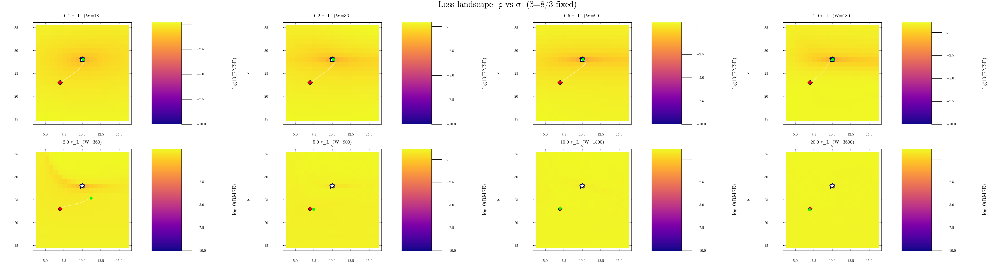

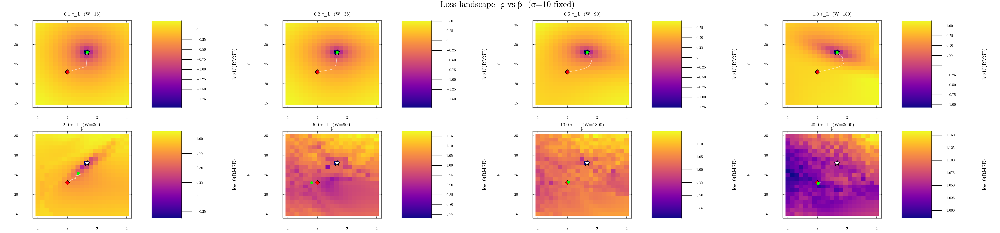

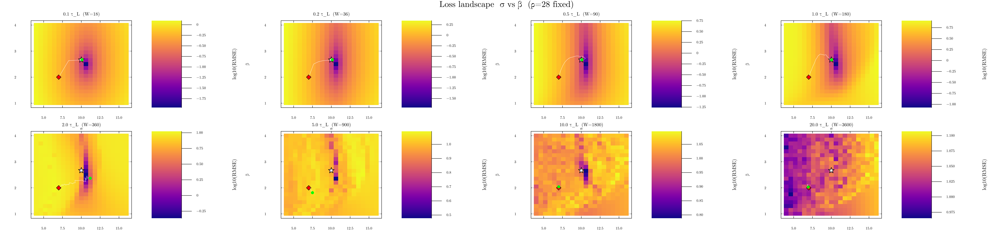

Saved 2D landscape figures.


In [67]:
# ============================================================
# Plot 2D loss landscape heatmaps
# 3 figures (one per parameter pair), each with 8 panels (2×4)
# Training paths from all_seeds_3p[1] overlaid in matching colour
# ============================================================

# Use log10 of loss for colour — better contrast across the wide dynamic range
_log_land(A) = log10.(max.(A, 1e-10))

function make_heatmap_panel(xvals, yvals, land2d, ws_idx, xlabel_str, ylabel_str;
                             true_x, true_y, init_x=nothing, init_y=nothing,
                             path_x=nothing, path_y=nothing)
    ws = WINDOW_SIZES[ws_idx]
    lt = round(ws / LYAP_STEPS, digits=1)
    Z  = _log_land(land2d[:, :, ws_idx])      # axes: [y-param, x-param]

    p = heatmap(xvals, yvals, Z;
        xlabel = xlabel_str, ylabel = ylabel_str,
        title  = @sprintf("%.1f τ_L  (W=%d)", lt, ws),
        color  = :plasma,
        colorbar = true,
        titlefontsize  = 9,
        guidefontsize  = 8,
        tickfontsize   = 7,
        aspect_ratio   = :none,                             # fill subplot box (visually square panel)
        colorbar_title = "log10(RMSE)",
        framestyle     = :box,
    )
    # true minimum
    scatter!(p, [true_x], [true_y];
             marker=:star5, markersize=9, markercolor=:white,
             markerstrokecolor=:black, markerstrokewidth=1,
             label=false)
    # initial guess
    if !isnothing(init_x) && !isnothing(init_y)
        scatter!(p, [init_x], [init_y];
                 marker=:diamond, markersize=7, markercolor=:red,
                 markerstrokecolor=:black, markerstrokewidth=0.8,
                 label=false)
    end
    # training path (projected onto this 2D plane)
    if !isnothing(path_x) && !isnothing(path_y)
        n = min(length(path_x), length(path_y))
        pal_k = get(ColorSchemes.RdYlBu_10, 1.0 - (ws_idx-1)/(length(WINDOW_SIZES)-1))
        plot!(p, path_x[1:n], path_y[1:n];
              linewidth=1.2, color=:white, alpha=0.6, label=false)
        scatter!(p, [path_x[1]], [path_y[1]];
                 marker=:circle, markersize=5, markercolor=:red,
                 markerstrokewidth=0, label=false)
        scatter!(p, [path_x[n]], [path_y[n]];
                 marker=:circle, markersize=5, markercolor=:lime,
                 markerstrokewidth=0, label=false)
    end
    return p
end

kw_fig = (; left_margin=10Plots.mm, bottom_margin=4Plots.mm,
            top_margin=3Plots.mm, right_margin=8Plots.mm)

# ── Figure 1: ρ (y-axis) vs σ (x-axis) ───────────────────────────────────────
panels_ρσ = [make_heatmap_panel(
    σ2, ρ2, land2d_ρσ, k, "σ", "ρ";
    true_x  = true_params.σ,       true_y  = true_params.ρ,
    init_x  = init_params_all.σ,   init_y  = init_params_all.ρ,
    path_x  = all_seeds_3p[1][k].sigma_trace,
    path_y  = all_seeds_3p[1][k].rho_trace,
) for k in eachindex(WINDOW_SIZES)]

fig2d_ρσ = plot(panels_ρσ...; layout=(2,4), size=(3000, 800), dpi=200,
                plot_title="Loss landscape  ρ vs σ  (β=8/3 fixed)", kw_fig...)
display(fig2d_ρσ)
savefig(fig2d_ρσ, joinpath(img_dir, "landscape_2d_rho_sigma.pdf"))
savefig(fig2d_ρσ, joinpath(img_dir, "landscape_2d_rho_sigma.png"))

# ── Figure 2: ρ (y-axis) vs β (x-axis) ───────────────────────────────────────
panels_ρβ = [make_heatmap_panel(
    β2, ρ2, land2d_ρβ, k, "β", "ρ";
    true_x  = true_params.β,       true_y  = true_params.ρ,
    init_x  = init_params_all.β,   init_y  = init_params_all.ρ,
    path_x  = all_seeds_3p[1][k].beta_trace,
    path_y  = all_seeds_3p[1][k].rho_trace,
) for k in eachindex(WINDOW_SIZES)]

fig2d_ρβ = plot(panels_ρβ...; layout=(2,4), size=(3000, 700), dpi=200,
                plot_title="Loss landscape  ρ vs β  (σ=10 fixed)", kw_fig...)
display(fig2d_ρβ)
savefig(fig2d_ρβ, joinpath(img_dir, "landscape_2d_rho_beta.pdf"))
savefig(fig2d_ρβ, joinpath(img_dir, "landscape_2d_rho_beta.png"))

# ── Figure 3: β (y-axis) vs σ (x-axis) ───────────────────────────────────────
panels_σβ = [make_heatmap_panel(
    σ2, β2, land2d_σβ, k, "σ", "β";
    true_x  = true_params.σ,       true_y  = true_params.β,
    init_x  = init_params_all.σ,   init_y  = init_params_all.β,
    path_x  = all_seeds_3p[1][k].sigma_trace,
    path_y  = all_seeds_3p[1][k].beta_trace,
) for k in eachindex(WINDOW_SIZES)]

fig2d_σβ = plot(panels_σβ...; layout=(2,4), size=(3000, 700), dpi=200,
                plot_title="Loss landscape  σ vs β  (ρ=28 fixed)", kw_fig...)
display(fig2d_σβ)
savefig(fig2d_σβ, joinpath(img_dir, "landscape_2d_sigma_beta.pdf"))
savefig(fig2d_σβ, joinpath(img_dir, "landscape_2d_sigma_beta.png"))

println("Saved 2D landscape figures.")

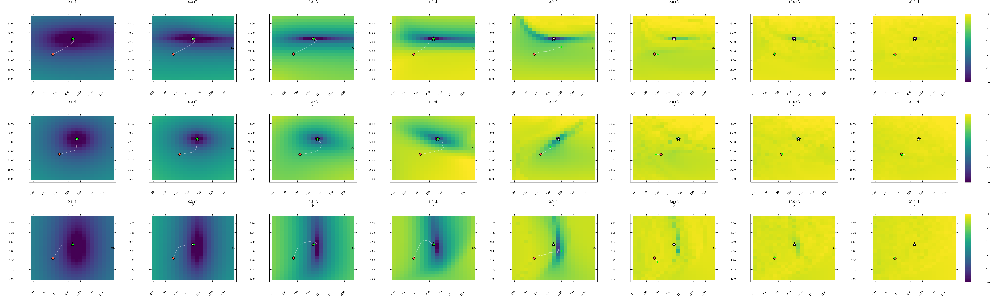

Saved → /Users/niklasviebig/master_thesis/LorenzParameterEstimation/examples_weather/test_cases_milan/img/landscape_2d_all.pdf


In [60]:
# ============================================================
# Plot 2D loss landscape heatmaps  —  3 rows × (8 data cols + 1 narrow colorbar col)
# ⭐ white star = true min  |  ◆ red = initial guess
# white line = training path (seed 1), red dot = start, green dot = end
# ============================================================

_log_land(A) = log10.(max.(A, 1e-10))

# ── Shared colour limits ───────────────────────────────────────────────────────
all_logZ = vcat(
    [vec(_log_land(land2d_ρσ[:,:,k])) for k in eachindex(WINDOW_SIZES)]...,
    [vec(_log_land(land2d_ρβ[:,:,k])) for k in eachindex(WINDOW_SIZES)]...,
    [vec(_log_land(land2d_σβ[:,:,k])) for k in eachindex(WINDOW_SIZES)]...,
)
gclims = (quantile(all_logZ, 0.01), quantile(all_logZ, 0.99))
nw = length(WINDOW_SIZES)

# ── Data panel ────────────────────────────────────────────────────────────────
function make_heatmap_panel(xvals, yvals, land2d, ws_idx, xlabel_str, ylabel_str;
                             true_x, true_y,
                             init_x=nothing, init_y=nothing,
                             path_x=nothing, path_y=nothing)
    ws = WINDOW_SIZES[ws_idx]
    lt = round(ws / LYAP_STEPS, digits=1)
    Z  = _log_land(land2d[:, :, ws_idx])
    p  = heatmap(xvals, yvals, Z;
        xlabel        = xlabel_str,
        ylabel        = ylabel_str,
        title         = @sprintf("%.1f tL", lt),   # short title — no clipping
        color         = :viridis,
        clims         = gclims,
        colorbar      = :none,
        titlefontsize = 9,
        guidefontsize = 9,
        tickfontsize  = 7,
        framestyle    = :box,
        xticks        = xvals[1:3:end],
        yticks        = yvals[1:3:end],
        xformatter    = x -> @sprintf("%.2f", x),
        yformatter    = y -> @sprintf("%.2f", y),
        xrotation     = 45,
        left_margin   = 8Plots.mm,
        bottom_margin = 8Plots.mm,
        top_margin    = 10Plots.mm,
        right_margin  = 2Plots.mm,
    )
    scatter!(p, [true_x], [true_y];
             marker=:star5, markersize=8, markercolor=:white,
             markerstrokecolor=:black, markerstrokewidth=1, label=false)
    if !isnothing(init_x)
        scatter!(p, [init_x], [init_y];
                 marker=:diamond, markersize=6, markercolor=:tomato,
                 markerstrokecolor=:black, markerstrokewidth=0.8, label=false)
    end
    if !isnothing(path_x)
        n = min(length(path_x), length(path_y))
        plot!(p, path_x[1:n], path_y[1:n];
              linewidth=1.0, color=:white, alpha=0.55, label=false)
        scatter!(p, [path_x[1]], [path_y[1]];
                 marker=:circle, markersize=4, markercolor=:tomato, markerstrokewidth=0, label=false)
        scatter!(p, [path_x[n]], [path_y[n]];
                 marker=:circle, markersize=4, markercolor=:lime,   markerstrokewidth=0, label=false)
    end
    return p
end

# ── Colorbar strip panel ───────────────────────────────────────────────────────
function make_colorbar_panel()
    yv        = collect(range(gclims[1], gclims[2], length=60))
    z         = repeat(yv, 1, 2)
    tick_vals = collect(range(gclims[1], gclims[2], length=6))
    heatmap([0.0, 1.0], yv, z;
        color         = :viridis,
        clims         = gclims,
        colorbar      = :none,
        framestyle    = :box,
        xticks        = nothing,
        yticks        = (tick_vals, [@sprintf("%.1f", v) for v in tick_vals]),
        xlabel        = "",
        ylabel        = "log10(RMSE)",
        guidefontsize = 8,
        tickfontsize  = 7,
        ymirror       = true,
        left_margin   = 1Plots.mm,
        right_margin  = 10Plots.mm,
        top_margin    = 10Plots.mm,
        bottom_margin = 8Plots.mm,
    )
end

# ── Build panels ───────────────────────────────────────────────────────────────
panels_ρσ = [make_heatmap_panel(σ2, ρ2, land2d_ρσ, k, "σ", "ρ";
    true_x=true_params.σ,     true_y=true_params.ρ,
    init_x=init_params_all.σ, init_y=init_params_all.ρ,
    path_x=all_seeds_3p[1][k].sigma_trace, path_y=all_seeds_3p[1][k].rho_trace)
    for k in 1:nw]

panels_ρβ = [make_heatmap_panel(β2, ρ2, land2d_ρβ, k, "β", "ρ";
    true_x=true_params.β,     true_y=true_params.ρ,
    init_x=init_params_all.β, init_y=init_params_all.ρ,
    path_x=all_seeds_3p[1][k].beta_trace,  path_y=all_seeds_3p[1][k].rho_trace)
    for k in 1:nw]

panels_σβ = [make_heatmap_panel(σ2, β2, land2d_σβ, k, "σ", "β";
    true_x=true_params.σ,     true_y=true_params.β,
    init_x=init_params_all.σ, init_y=init_params_all.β,
    path_x=all_seeds_3p[1][k].sigma_trace, path_y=all_seeds_3p[1][k].beta_trace)
    for k in 1:nw]

all_panels = [panels_ρσ..., make_colorbar_panel(),
              panels_ρβ..., make_colorbar_panel(),
              panels_σβ..., make_colorbar_panel()]

# Narrow last column (5% of width) for the colorbar strip
l = @layout [
    a  b  c  d  e  f  g  h  i{0.008w}
    j  k  l  m  n  o  p  q  r{0.008w}
    s  t  u  v  w  x  y  z  A{0.008w}
]

fig2d_all = plot(all_panels...;
    layout = l,
    size   = (4000, 1200),
    dpi    = 200,
    link   = :none,
)

display(fig2d_all)
savefig(fig2d_all, joinpath(img_dir, "landscape_2d_all.pdf"))
savefig(fig2d_all, joinpath(img_dir, "landscape_2d_all.png"))
println("Saved → ", abspath(joinpath(img_dir, "landscape_2d_all.pdf")))

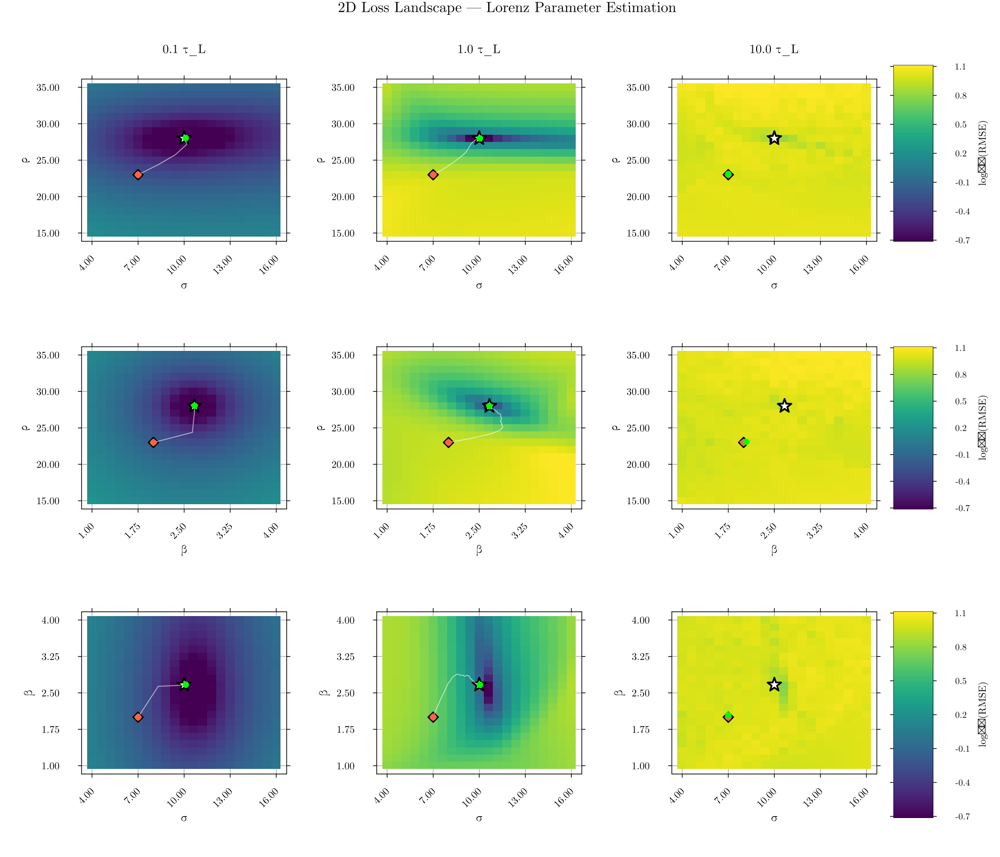

Saved → /Users/niklasviebig/master_thesis/LorenzParameterEstimation/examples_weather/test_cases_milan/img/landscape_2d_selected.pdf


GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph missing from current font: 8320
GKS: glyph missing from current font: 8321
GKS: glyph 

In [62]:

# ============================================================
# Selected windows plot: 0.1 tL | 1.0 tL | 10.0 tL
# 3 rows (ρ-σ, ρ-β, σ-β) × 3 columns + shared colorbar strip
# ★ white star = true params  ◆ red = initial guess
# white line = training path (seed 1), red = start, green = end
# ============================================================

sel_indices = [
    findfirst(==(18),   WINDOW_SIZES),   # 0.1 tL
    findfirst(==(180),  WINDOW_SIZES),   # 1.0 tL
    findfirst(==(1800), WINDOW_SIZES),   # 10.0 tL
]
sel_titles = ["0.1 τ_L", "1.0 τ_L", "10.0 τ_L"]

# Each row: (xvals, yvals, data3d, xlabel, ylabel, true_x, true_y, init_x, init_y, path_x_field, path_y_field)
sel_rows = [
    (σ2, ρ2, land2d_ρσ, "σ", "ρ",
     true_params.σ, true_params.ρ, init_params_all.σ, init_params_all.ρ,
     :sigma_trace, :rho_trace),
    (β2, ρ2, land2d_ρβ, "β", "ρ",
     true_params.β, true_params.ρ, init_params_all.β, init_params_all.ρ,
     :beta_trace, :rho_trace),
    (σ2, β2, land2d_σβ, "σ", "β",
     true_params.σ, true_params.β, init_params_all.σ, init_params_all.β,
     :sigma_trace, :beta_trace),
]

function make_sel_panel(xvals, yvals, data3d, ws_idx, xlabel_str, ylabel_str,
                        col_title, true_x, true_y, init_x, init_y, path_x, path_y)
    Z = _log_land(data3d[:, :, ws_idx])
    nx, ny = length(xvals), length(yvals)
    # every ~4 ticks so labels don't crowd
    xi = xvals[1:max(1, nx÷4):end]
    yi = yvals[1:max(1, ny÷4):end]
    p = heatmap(xvals, yvals, Z;
        color         = :viridis,
        clims         = gclims,
        colorbar      = false,
        xlabel        = xlabel_str,
        ylabel        = ylabel_str,
        title         = col_title,
        titlefontsize = 11,
        guidefontsize = 10,
        tickfontsize  = 9,
        framestyle    = :box,
        xticks        = (xi, [@sprintf("%.2f", v) for v in xi]),
        yticks        = (yi, [@sprintf("%.2f", v) for v in yi]),
        xrotation     = 45,
        tick_direction = :out,
        left_margin   = 10Plots.mm,
        bottom_margin = 12Plots.mm,
        top_margin    = 6Plots.mm,
        right_margin  = 1Plots.mm,
    )
    # true minimum
    scatter!(p, [true_x], [true_y];
             marker=:star5, markersize=10, markercolor=:white,
             markerstrokecolor=:black, markerstrokewidth=1, label=false)
    # initial guess
    scatter!(p, [init_x], [init_y];
             marker=:diamond, markersize=7, markercolor=:tomato,
             markerstrokecolor=:black, markerstrokewidth=0.8, label=false)
    # training path
    n = min(length(path_x), length(path_y))
    if n > 0
        plot!(p, path_x[1:n], path_y[1:n];
              linewidth=1.2, color=:white, alpha=0.6, label=false)
        scatter!(p, [path_x[1]], [path_y[1]];
                 marker=:circle, markersize=5, markercolor=:tomato,
                 markerstrokewidth=0, label=false)
        scatter!(p, [path_x[n]], [path_y[n]];
                 marker=:circle, markersize=5, markercolor=:lime,
                 markerstrokewidth=0, label=false)
    end
    return p
end

function make_sel_colorbar()
    yv        = collect(range(gclims[1], gclims[2], length=80))
    z         = repeat(yv, 1, 2)
    tick_vals = collect(range(gclims[1], gclims[2], length=7))
    heatmap([0.0, 1.0], yv, z;
        color         = :viridis,
        clims         = gclims,
        colorbar      = false,
        framestyle    = :box,
        xticks        = nothing,
        yticks        = (tick_vals, [@sprintf("%.1f", v) for v in tick_vals]),
        ylabel        = "log₁₀(RMSE)",
        xlabel        = "",
        guidefontsize = 9,
        tickfontsize  = 8,
        ymirror       = true,
        tick_direction = :out,
        left_margin   = 1Plots.mm,
        right_margin  = 8Plots.mm,
        top_margin    = 6Plots.mm,
        bottom_margin = 12Plots.mm,
    )
end

# ── assemble panels row-by-row ────────────────────────────────────────────────
all_sel_panels = []
for (ri, (xv, yv, data, xl, yl, tx, ty, ix, iy, px_f, py_f)) in enumerate(sel_rows)
    for (ci, ws_idx) in enumerate(sel_indices)
        col_title = (ri == 1) ? sel_titles[ci] : ""   # titles only on top row
        px = getfield(all_seeds_3p[1][ws_idx], px_f)
        py = getfield(all_seeds_3p[1][ws_idx], py_f)
        push!(all_sel_panels, make_sel_panel(xv, yv, data, ws_idx, xl, yl,
                                              col_title, tx, ty, ix, iy, px, py))
    end
    push!(all_sel_panels, make_sel_colorbar())
end

# Layout: 3 rows × (3 data + 1 narrow colorbar)
l_sel = @layout [
    a  b  c  d{0.06w}
    e  f  g  h{0.06w}
    i  j  k  l{0.06w}
]

fig_sel = plot(all_sel_panels...;
    layout           = l_sel,
    size             = (1400, 1200),
    dpi              = 150,
    link             = :none,
    plot_title       = "2D Loss Landscape — Lorenz Parameter Estimation",
    plot_titlefontsize = 13,
)

display(fig_sel)
savefig(fig_sel, joinpath(img_dir, "landscape_2d_selected.pdf"))
savefig(fig_sel, joinpath(img_dir, "landscape_2d_selected.png"))
println("Saved → ", abspath(joinpath(img_dir, "landscape_2d_selected.pdf")))
